<a href="https://colab.research.google.com/github/Diz138/2022NFLScoutingCombineAnalysis/blob/main/In_game_pipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Imports**

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import math

# **Directory**

In [37]:
df = pd.read_csv('/content/game_tracking_data.csv')
#CSV provided by NFL 

# **Plot Path Function**

In [38]:
def plot_speed_range(move_array, min_speed_range, max_speed_range, color):
    x_array = []
    y_array = []

    for i in range (len(move_array)):
        if (move_array[i].s >= min_speed_range and move_array[i].s < max_speed_range):
            x_array.append(move_array[i].inverted_x)
            y_array.append(move_array[i].inverted_y)
        elif (len(x_array) > 0 ):
            x_array.append(move_array[i].inverted_x)
            y_array.append(move_array[i].inverted_y)

            plt.plot(x_array, y_array, c=color, linewidth = 0, marker='.')

            x_array = []
            y_array = []

    if (len(x_array) >= 1 ):
        plt.plot(x_array, y_array, c=color, linewidth = 0, marker='.')

In [39]:
def plot_path_in_game(move_array,total_time,xmin,xmax,ymin,ymax):
    max_acc       = 0
    min_acc_threshold = 1
    for element in move_array:
      playerId = element.playerId
      if (max_acc < element.a):
        max_acc = element.a
    max_acc = round(max_acc, 1)
    if (max_acc < min_acc_threshold):
        return
    plt.scatter(move_array[0].inverted_x,move_array[0].inverted_y,100, c="orange")

    plot_speed_range(move_array,0,1,"black")
    plot_speed_range(move_array,0,2,color='#abdbe3')
    plot_speed_range(move_array,2.000000000000001,4,color="#00bfff")
    plot_speed_range(move_array,4.000000000000001,6,color="#000df9") 
    plot_speed_range(move_array,6.000000000000001,8, color="#1100CE")
    plot_speed_range(move_array,8.000000000000001,100,color="#00008B")

    plt.title(f"PlayerId {playerId}, playId {move_array[0].playId} Time {str(total_time)} second, Max acc {str(max_acc)}")
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax)
    plt.xlabel("X (yards)")
    plt.ylabel("Y (yards)")
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.xlim(0,40)
    plt.ylim(-20,40)
    plt.show()
  

# **Dirctional X and Y Acceleration and Velocity**

In [40]:
# Define a function to calculate acceleration
def calculate_acceleration(df):
    prev_value_x = 0
    prev_value_y = 0
    prev_value_vel_x = 0
    prev_value_vel_y = 0

    prev_column = 0

    ball_snap_event = False

    for i, row in df.iterrows():
        if i == 0:
            prev_column = row.playId

        if row.event == 'ball_snap' or ball_snap_event == True:
            ball_snap_event = True
            prev_value_x = df.iloc[i-1]['x']
            prev_value_y = df.iloc[i-1]['y']
            # Check if the current row is a ball_snap

            if prev_column == row.playId:
                df.loc[i, 'vel_x'] = (row.x - prev_value_x) / 0.1
                df.loc[i, 'vel_y'] = (row.y - prev_value_y) / 0.1
                # Calculate velocities

                current_vel_x = (row.x - prev_value_x) / 0.1
                current_vel_y = (row.y - prev_value_y) / 0.1
                # Calculate current velocities

                acc_x = (current_vel_x - prev_value_vel_x) / 0.1
                acc_y = (current_vel_y - prev_value_vel_y) / 0.1
                # Calculate acceleration

                df.loc[i, 'acc_x'] = acc_x
                df.loc[i, 'acc_y'] = acc_y
                # Add new columns for acceleration

                prev_value_vel_x = current_vel_x
                prev_value_vel_y = current_vel_y
                # Update previous velocities

            prev_column = row.playId

    return df

# Call the function to calculate acceleration
df = calculate_acceleration(df)

# **Create Route-Specific Data Frames**

In [41]:
grouped = df.groupby(['gameKey','playId'])

for name, group in grouped:
    if not any(val in group['event'].values for val in ('pass_outcome_incomplete', 'pass_outcome_caught',)):
    # Check if the required values in the "event" column are not present

        last_row = group.tail(1)
        df.at[last_row.index[0], 'event'] = 'End'
        # Insert the word "End" in the row before the next play starts


end_rows = df[df['event'] == 'End']
gameKey_playId = end_rows[['gameKey','playId']]
# Identify the rows that now have the word "End" in the "event" column and # record the "gameKey" and "playId" values of these rows


df = df[~((df['gameKey'].isin(gameKey_playId['gameKey'])) & (df['playId'].isin(gameKey_playId['playId'])))]
# Drop all the rows that have the same "gameKey" and "playId" values as the rows that have "End" in the "event" column


df = df.dropna(subset=['vel_x', 'vel_y'], how='any')
df.iloc[:,9].fillna(value='None', inplace=True)

row_to_collect = False
# Identify plays we want to add to a final dataframe
result = []
for i, row in df.iterrows():
    if row.event == "ball_snap":
        row_to_collect = True
        result.append(row)
    elif row.event in ["pass_outcome_incomplete", "pass_outcome_caught"]:
        row_to_collect = False
        result.append(row)
    elif row_to_collect:
        result.append(row)
    else:
        pass

df = pd.DataFrame(result)

for i, row in df.iterrows():
    if row.event == "ball_snap":
       df.loc[i, 'acc_x'] = 0 
       df.loc[i, 'acc_y'] = 0 
       # Adding 0's into accelerations corrisponding "ball_snap" row as accelation at the start of a play should be 0

def route_segmenter(df, route):
    route_df = df.loc[df.route == route].reset_index(drop=True)
    print(f"There are {route_df.groupby(['playId', 'gameKey']).ngroups} {route_df.iloc[0].route} routes in this dataset")
    num_players_all = route_df.groupby(['playerId', 'playId', 'gameKey']).size().reset_index(name='count')
    num_players_r = num_players_all.groupby(['playerId']).size()
    route_info = route_df.merge(num_players_all, on=['playerId', 'playId', 'gameKey'])
    return route_info


corner_routes = route_segmenter(df, 'CORNER')
corner_routes_df = pd.DataFrame(corner_routes)

go_routes = route_segmenter(df, 'GO')
go_routes_df = pd.DataFrame(go_routes)

out_routes = route_segmenter(df, 'OUT')
out_routes_df = pd.DataFrame(out_routes)

hitch_routes = route_segmenter(df, 'HITCH')
hitch_routes_df = pd.DataFrame(hitch_routes)

in_routes = route_segmenter(df, 'IN')
in_routes_df = pd.DataFrame(in_routes)

post_routes = route_segmenter(df, 'POST')
post_routes_df = pd.DataFrame(post_routes)

slant_routes = route_segmenter(df, 'SLANT')
slant_routes_df = pd.DataFrame(slant_routes)

There are 133 CORNER routes in this dataset
There are 711 GO routes in this dataset
There are 230 OUT routes in this dataset
There are 425 HITCH routes in this dataset
There are 233 IN routes in this dataset
There are 199 POST routes in this dataset
There are 189 SLANT routes in this dataset


# **Route Preprocessing**

In [42]:
df = slant_routes_df
# Change based on desired route

# **Route Tranfromation: Begin on Axis, Run Toward the Right**

In [43]:
grouped = df.groupby(['playId', 'gameKey']).filter(lambda group: group['gameKey'].nunique() == 1)
df = grouped.reset_index(drop=True)
# Removes rows where the same playID was recorded across multiple games

df = df.assign(zeroed_y = float('NaN'), zeroed_x = float('NaN'))
# Add two new columns to the dataframe

ball_snap_indices = df.loc[df['event'] == 'ball_snap'].index
for ball_snap_index in ball_snap_indices:
    df.loc[ball_snap_index, 'zeroed_y'] = 0
    df.loc[ball_snap_index, 'zeroed_x'] = 0
    calculate_zeroed_coords = True
    ball_snap_valueX = df.loc[ball_snap_index, 'x']
    ball_snap_valueY = df.loc[ball_snap_index, 'y']
    for i in range(ball_snap_index+1, df.shape[0]):
        if calculate_zeroed_coords:
            df.loc[i, 'zeroed_x'] = df.loc[i, 'x'] - ball_snap_valueX
            df.loc[i, 'zeroed_y'] = df.loc[i, 'y'] - ball_snap_valueY
        if df.loc[i, 'event'] in ['pass_outcome_incomplete', 'pass_outcome_caught']:
            calculate_zeroed_coords = False
            # For each of these row in a play following the ball snap, the zeroed_x and zeroed_y columns are set to the difference between the current X and Y coordinates and the ball snap coordinates

df['left_or_right_route'] = float('NaN')
# Add two new columns to the dataframe


ball_snap_indexes = df.loc[df['event'] == 'ball_snap'].index
for index in ball_snap_indexes:
    zerodx_value = df.loc[index+15, 'zeroed_x']
    if zerodx_value > 0:
        determine_left_or_right = df.loc[index+15, 'playId']
        df.loc[df['playId'] == determine_left_or_right, 'left_or_right_route'] = 'Right'
    elif zerodx_value < 0:
        determine_left_or_right = df.loc[index+15, 'playId']
        df.loc[df['playId'] == determine_left_or_right, 'left_or_right_route'] = 'Left'
        # Determine if a player is running left to right based on their zerod_x value 15 rows after the ball snap occurance


df['inverted_x'] = float('NaN')
for index, value in df['left_or_right_route'].iteritems():
    if value == 'Left':
        inverted_value = -df.at[index, 'zeroed_x']
        df.at[index, 'inverted_x'] = inverted_value
    elif value == 'Right':
        df.at[index, 'inverted_x'] = df.at[index, 'zeroed_x']
        # If a player ran toward the left, invert their X positions

df['inverted_y'] = float('NaN')
for index, value in df['left_or_right_route'].iteritems():
    if value == 'Left':
        inverted_value = -df.at[index, 'zeroed_y']
        df.at[index, 'inverted_y'] = inverted_value
    elif value == 'Right':
        df.at[index, 'inverted_y'] = df.at[index, 'zeroed_y']
        # If a player ran toward the left, invert their zeroed_y

df['inverted_vel_x'] = float('NaN')

for index, value in df['left_or_right_route'].iteritems():
    if value == 'Left':
        inverted_value = -df.at[index, 'vel_x']
        df.at[index, 'inverted_vel_x'] = inverted_value
    elif value == 'Right':
        df.at[index, 'inverted_vel_x'] = df.at[index, 'vel_x']
        # If a player ran toward the left, invert their vel_x positions


df['inverted_vel_y'] = float('NaN')

for index, value in df['left_or_right_route'].iteritems():
    if value == 'Left':
        inverted_value = -df.at[index, 'vel_y']
        df.at[index, 'inverted_vel_y'] = inverted_value
    elif value == 'Right':
        df.at[index, 'inverted_vel_y'] = df.at[index, 'vel_y']
        # If a player ran toward the left, invert their vel_y positions

df['inverted_acc_x'] = float('NaN')

for index, value in df['left_or_right_route'].iteritems():
    if value == 'Left':
        inverted_value = -df.at[index, 'acc_x']
        df.at[index, 'inverted_acc_x'] = inverted_value
    elif value == 'Right':
        df.at[index, 'inverted_acc_x'] = df.at[index, 'acc_x']
        # If a player ran toward the left, invert their acc_x positions


df['inverted_acc_y'] = float('NaN')

for index, value in df['left_or_right_route'].iteritems():
    if value == 'Left':
        inverted_value = -df.at[index, 'acc_y']
        df.at[index, 'inverted_acc_y'] = inverted_value
    elif value == 'Right':
      df.at[index, 'inverted_acc_y'] = df.at[index, 'acc_y']
      # If a player ran toward the left, invert their acc_y positions

<ipython-input-43-598c3490bda6>:40: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in df['left_or_right_route'].iteritems():
<ipython-input-43-598c3490bda6>:49: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in df['left_or_right_route'].iteritems():
<ipython-input-43-598c3490bda6>:59: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in df['left_or_right_route'].iteritems():
<ipython-input-43-598c3490bda6>:70: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in df['left_or_right_route'].iteritems():
<ipython-input-43-598c3490bda6>:80: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in df['left_or_right_route'].iteritems():
<ipython-input-

In [46]:
df

,gameKey,playId,playerId,ts,x,y,s,a,event,route,...,count,zeroed_y,zeroed_x,left_or_right_route,inverted_x,inverted_y,inverted_vel_x,inverted_vel_y,inverted_acc_x,inverted_acc_y
0,58839,2762,54476,2022-09-11 15:11:25.400000,101.66,44.25,0.00,0.00,ball_snap,SLANT,...,31,0.00,0.00,Left,-0.00,-0.00,0.1,-0.0,-0.0,-0.0
1,58839,2762,54476,2022-09-11 15:11:25.500000,101.66,44.25,0.00,0.11,NaN,SLANT,...,31,0.00,0.00,Left,-0.00,-0.00,-0.0,-0.0,-1.0,-0.0
2,58839,2762,54476,2022-09-11 15:11:25.599999,101.65,44.25,0.10,1.20,NaN,SLANT,...,31,0.00,-0.01,Left,0.01,-0.00,0.1,-0.0,1.0,-0.0
3,58839,2762,54476,2022-09-11 15:11:25.700000,101.63,44.24,0.29,1.93,NaN,SLANT,...,31,-0.01,-0.03,Left,0.03,0.01,0.2,0.1,1.0,1.0
4,58839,2762,54476,2022-09-11 15:11:25.799999,101.59,44.24,0.54,2.23,NaN,SLANT,...,31,-0.01,-0.07,Left,0.07,0.01,0.4,-0.0,2.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6010,59105,3541,54481,2023-01-08 19:07:15.000000,68.11,31.26,5.79,3.31,NaN,SLANT,...,27,-4.43,7.45,Right,7.45,-4.43,1.7,-5.6,-4.0,-1.0
6011,59105,3541,54481,2023-01-08 19:07:15.099999,68.25,30.72,5.62,3.04,NaN,SLANT,...,27,-4.97,7.59,Right,7.59,-4.97,1.4,-5.4,-3.0,2.0
6012,59105,3541,54481,2023-01-08 19:07:15.200000,68.36,30.17,5.49,2.82,NaN,SLANT,...,27,-5.52,7.70,Right,7.70,-5.52,1.1,-5.5,-3.0,-1.0
6013,59105,3541,54481,2023-01-08 19:07:15.299999,68.46,29.64,5.31,2.53,autoevent_passinterrupted,SLANT,...,27,-6.05,7.80,Right,7.80,-6.05,1.0,-5.3,-1.0,2.0


In [47]:
df = df.drop(columns=["zeroed_x", "zeroed_y", "count", "vel_x", "vel_y"])

# **Create Output CSV**

In [48]:
df.to_csv("slant_routes_new.csv")
# Rename based on selected route

# **Plotting**


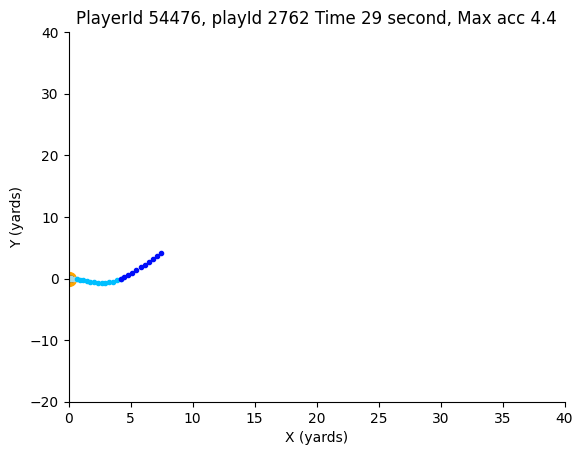

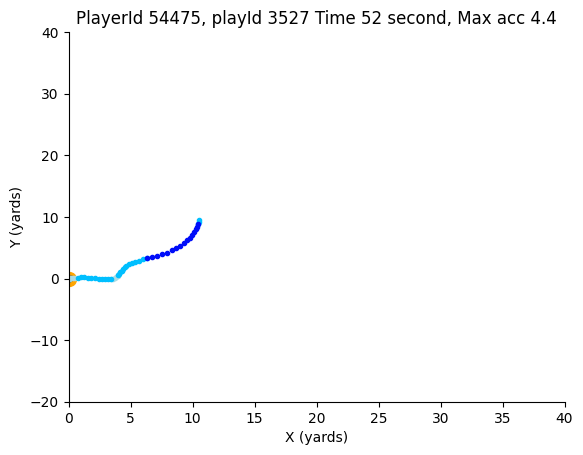

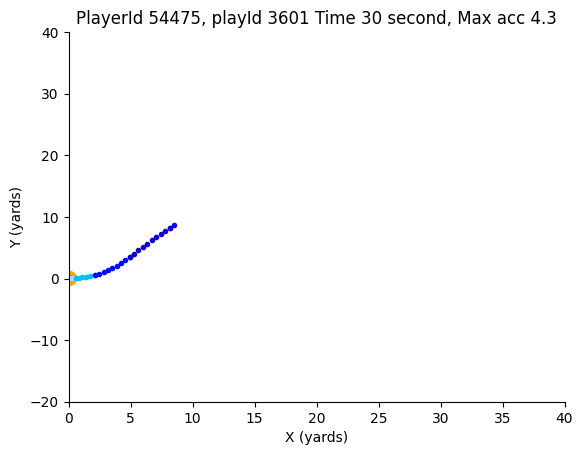

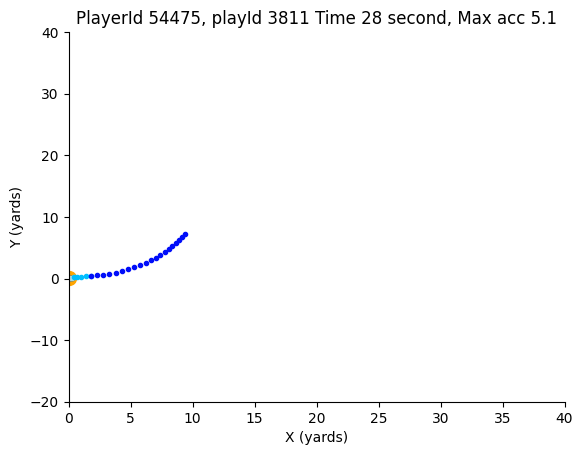

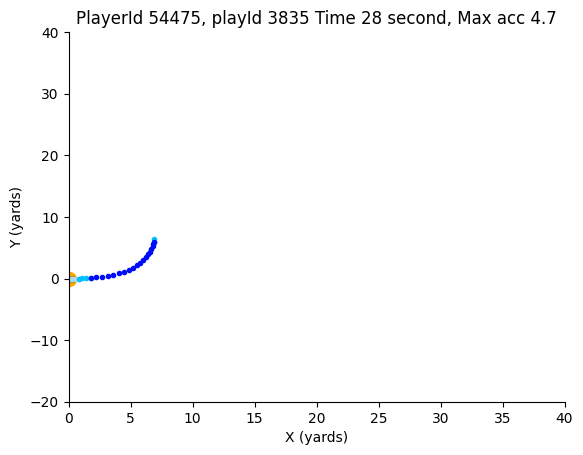

...

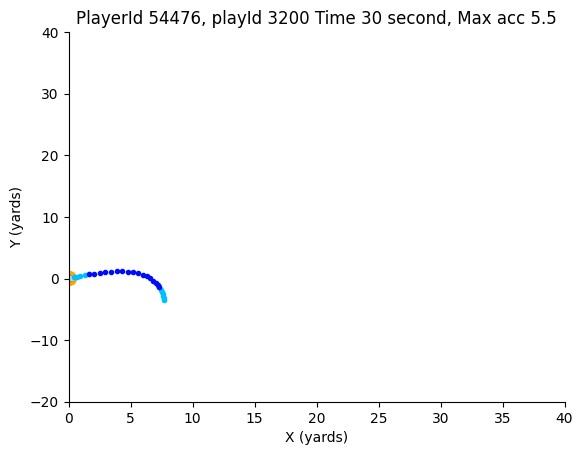

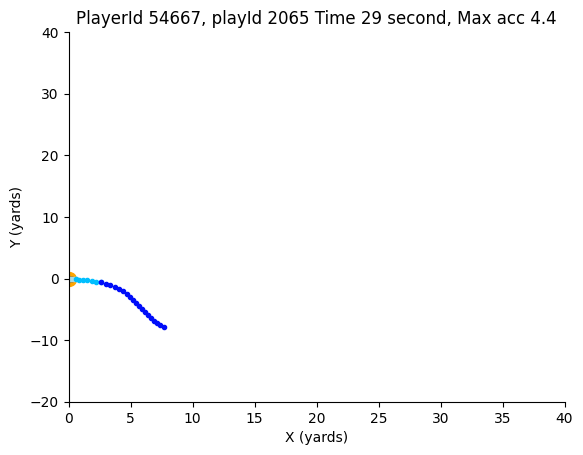

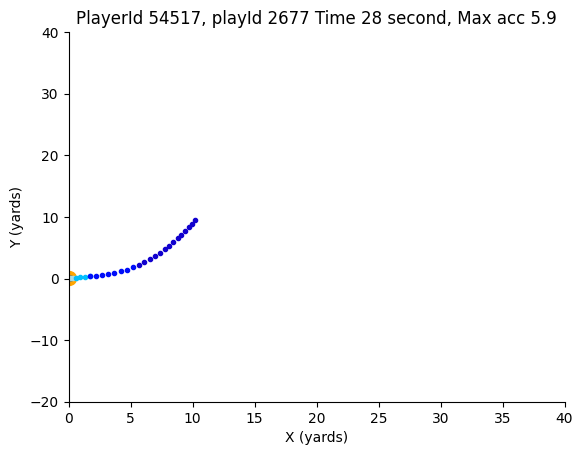

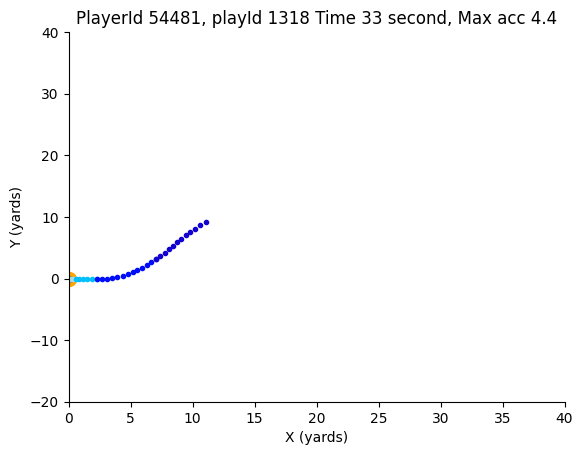

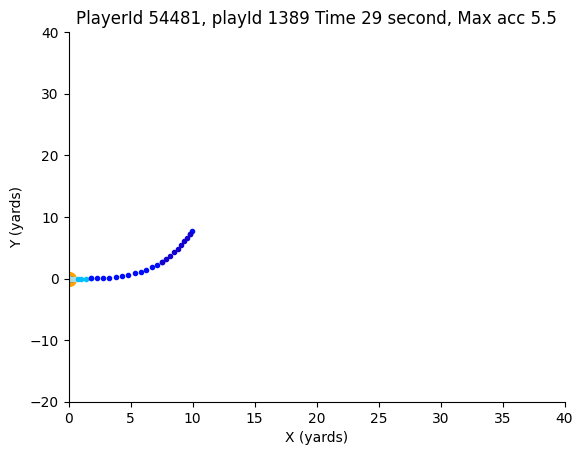

In [49]:
current_value = None
playdIdsimilar =[]

for i, row in df.iterrows():
    if current_value != row.playId:
        # If the current row's value in of the playID is different from the previous row, create a new dot plot
        current_value = row.playId
        if i != 0:
          plot_path_in_game(playdIdsimilar,len(playdIdsimilar)-1,0, 40,-50,50)
          playdIdsimilar = []

    else:
        playdIdsimilar.append(row)

#Create one plot per route

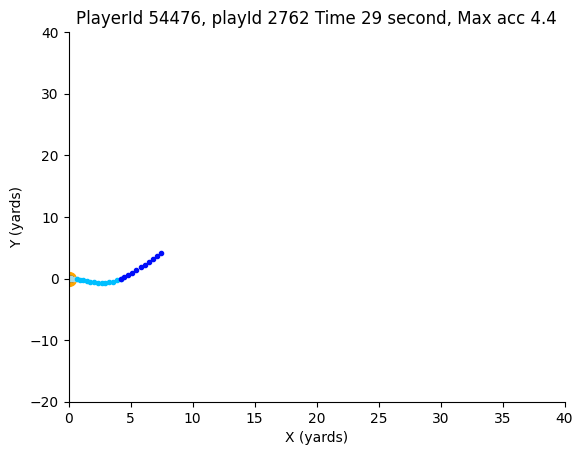

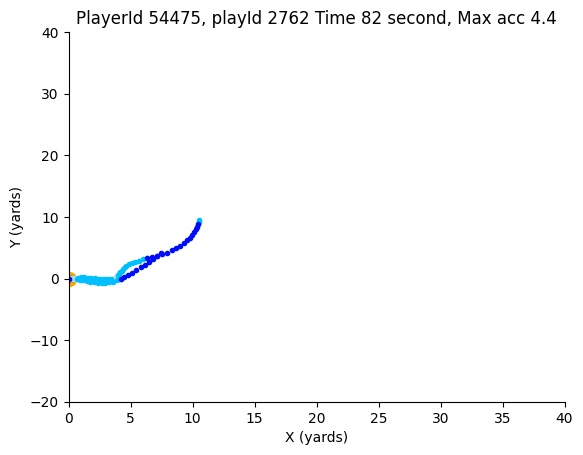

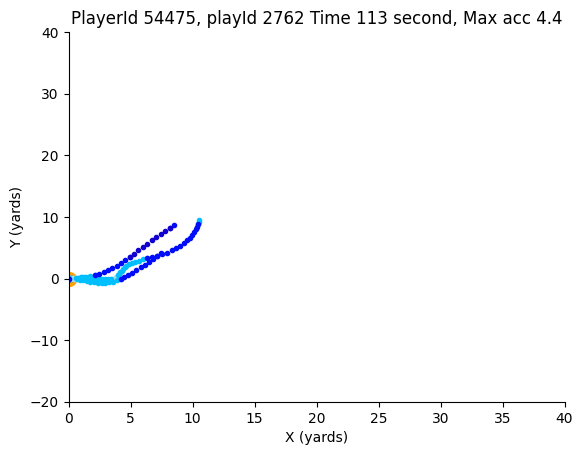

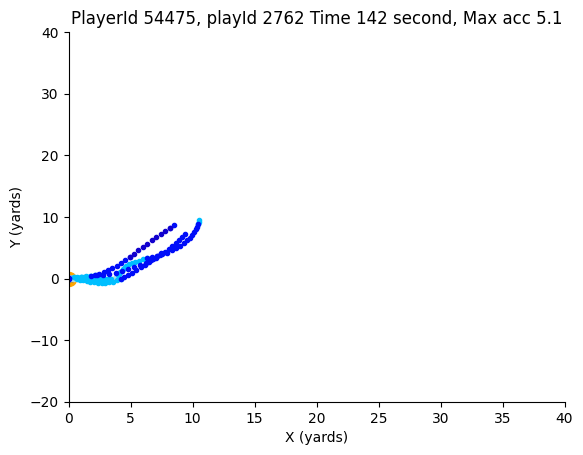

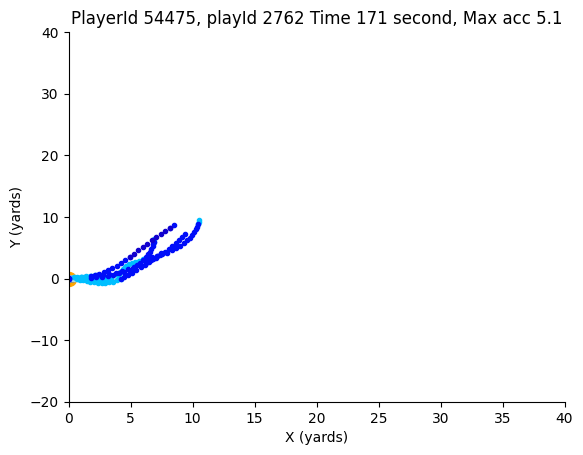

...

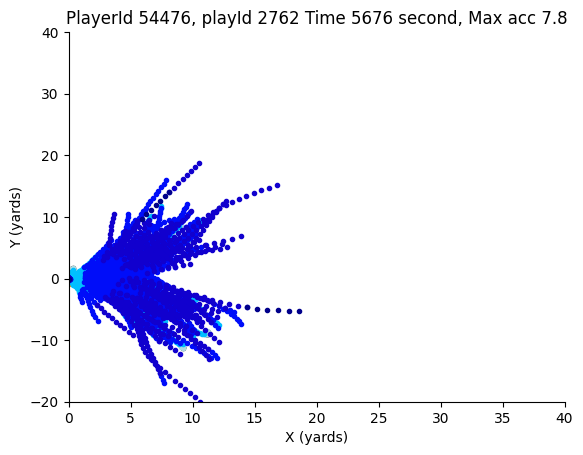

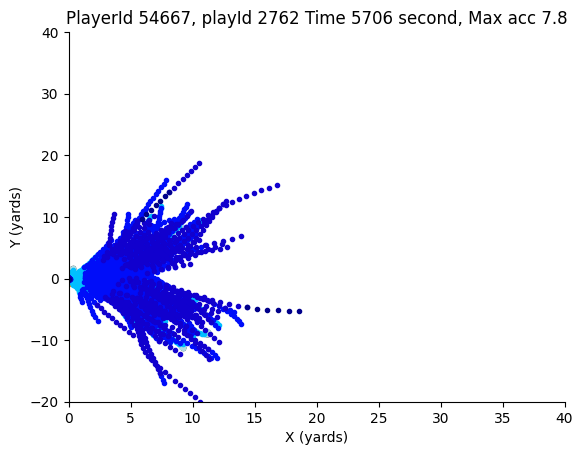

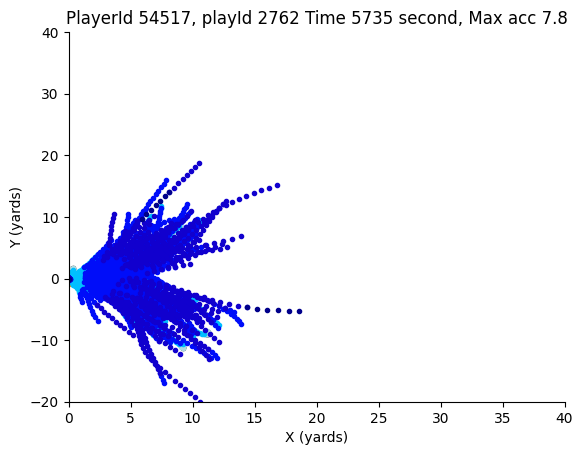

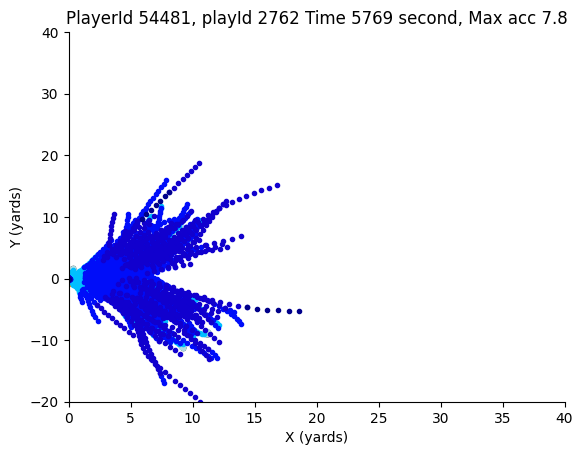

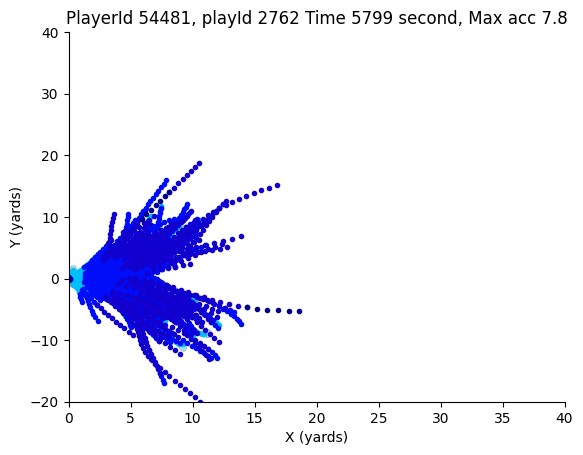

In [50]:
current_value = None
playdIdsimilar = []

for i, row in df.iterrows():
    if current_value != row.playId:
      current_value = row.playId
      if i != 0:
        plot_path_in_game(playdIdsimilar,len(playdIdsimilar)-1,0, 60,-50,50)

    else:
        playdIdsimilar.append(row)

# Create one cumulative plot showing each route